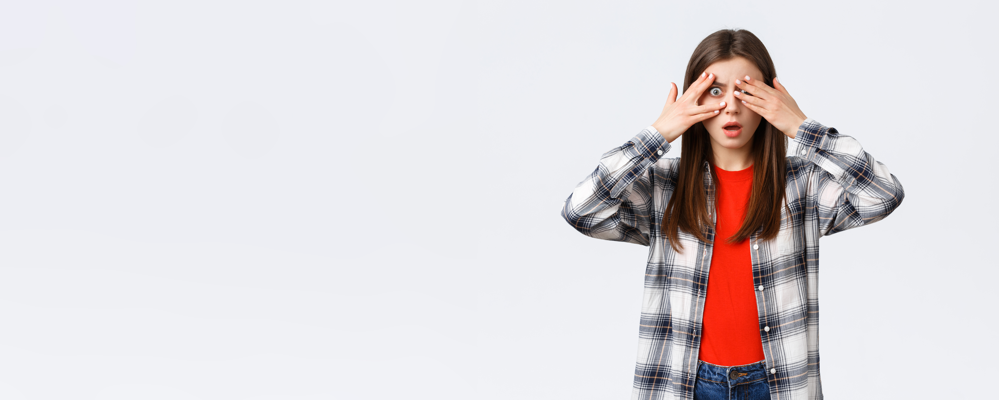

# 

In [1]:
import keras
from keras.models import Sequential
from keras.callbacks import ModelCheckpoint
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
import cv2
import matplotlib.pyplot as plt
import tensorflowjs as tfjs

# 

In [2]:
batch_size = 32
train_datagen = ImageDataGenerator(horizontal_flip = True, 
                                  rescale = 1./255, 
                                  zoom_range = 0.2)

In [3]:
train_data_path = 'C:/Users/Digival Solutions/Eye_detection/OACE'
train_set = train_datagen.flow_from_directory(train_data_path, target_size = (50,50),
                                              batch_size = batch_size, 
                                              color_mode = 'grayscale',
                                              class_mode = 'categorical')


Found 97860 images belonging to 2 classes.


# 

In [4]:
classes = 2

model = Sequential()
model.add(Conv2D(32, (3,3), padding = 'same', input_shape = (50,50,1), activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2)))

model.add(Conv2D(64, (3,3), padding = 'same', activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2)))

model.add(Conv2D(128,(3,3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2))) 

model.add(Flatten())

model.add(Dense(64, activation = 'relu'))

model.add(Dense(classes, activation = 'softmax'))


In [5]:
odel.compile(loss = 'categorical_crossentropy',optimizer = 'adam' , metrics = ['accuracy'])

In [6]:
model.fit_generator(train_set, epochs=3)

Epoch 1/3


C:\Users\Digival Solutions\AppData\Local\Temp\ipykernel_16856\1394775690.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(train_set, epochs=3)


3059/3059 [==============================] - 319s 104ms/step - loss: 0.1053 - accuracy: 0.9593
Epoch 2/3
3059/3059 [==============================] - 240s 79ms/step - loss: 0.0322 - accuracy: 0.9887
Epoch 3/3
3059/3059 [==============================] - 248s 81ms/step - loss: 0.0211 - accuracy: 0.9926


# 

# 

In [7]:
model.save("Eye_blinking_New_method.h5")

In [10]:
tfjs.converters.save_keras_model(model,'Eye_blinking_New_method')

# 

In [3]:
IMG_SIZE=50

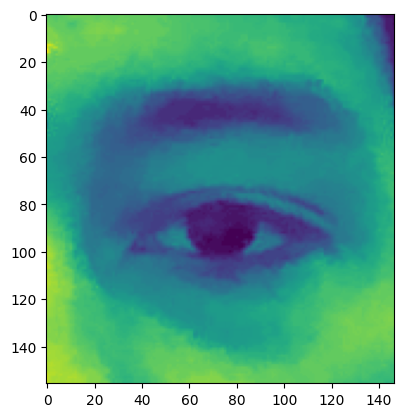

1/1 [==============================] - 2s 2s/step



Our model says it is a : open


In [8]:
img=cv2.imread("C:/Users/Digival Solutions/Eye_detection/Screenshots/opened/Screenshot_20230225_094729.png",0)
plt.imshow(img)
plt.show()
img=cv2.resize(img, (IMG_SIZE, IMG_SIZE))  
img=img.reshape(1,IMG_SIZE, IMG_SIZE,1)
y_pred = model.predict(img)

if y_pred[0,0] == 0:
    pred = 'open'
elif y_pred[0,0]==1:
     pred = 'closed'
        
print("""


Our model says it is a :""", pred)